# Human-Mammalian Brain - Basal Ganglia spatial transcriptomics gene expression

In this notebook, we build on the our [previous investigation](https://alleninstitute.github.io/abc_atlas_access/notebooks/hmba_bg_spatial_slabs_and_taxonomy.html) into the cell level metadata, combining the metadata gene expressions for select genes that we extract from the released h5ad files.

You need to be connected to the internet to run this notebook and have run through the [getting started notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html).

In [1]:
import json
import geojson
from typing import List, Tuple, Optional

import pandas as pd
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache
from abc_atlas_access.abc_atlas_cache.anndata_utils import get_gene_data

We will interact with the data using the **AbcProjectCache**. This cache object tracks which data has been downloaded and serves the path to the requested data on disk. For metadata, the cache can also directly serve a up a Pandas DataFrame. See the [``getting_started``](https://alleninstitute.github.io/abc_atlas_access/notebooks/getting_started.html) notebook for more details on using the cache including installing the cache if it has not already been.

**Change the download_base variable to where you would like to download the data in your system.**

In [2]:
download_base = Path('../../data/abc_atlas')
abc_cache = AbcProjectCache.from_cache_dir(
    download_base,
    s3_bucket='allen-brain-cell-atlas-staging',
    auth_required=True
)

abc_cache.current_manifest

'releases/20250630/manifest.json'

## Cell metadata

Each species in the HMBA spatial dataset has it's own h5ad files and associated cell metadata tables. We load each of these in turn starting from Human to Macaque to Marmoset. In the [previous tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/hmba_bg_spatial_slabs_and_taxonomy.html), we merged the cell metadata tables with their associated specimen metadatadata and then with the slab_plane coordinates we use to plot the cell locations.

Below we load each of the three species of the HMBA-BG data. We load the metadata tables we need for each species and join them in one cell this time.

Load the Human cells.

In [3]:
# Load the human cell metadata and specimen metadata
# and join them together with the slab plane coordinates.

human_cell_metadata = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-H22.30.001-BG',
    file_name='cell_metadata',
    dtype={"cell_label": str}
).set_index('cell_label')

human_specimen = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-H22.30.001-BG',
    file_name='specimen_metadata',
    dtype={"cell_label": str}
).set_index('brain_section_label')

human_cell_metadata = human_cell_metadata.join(human_specimen, on='brain_section_label', rsuffix='_specimen')

human_cell_slab_plane_coordinates = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-H22.30.001-BG',
    file_name='slab_plane_coordinates',
    dtype={"cell_label": str}
).set_index('cell_label')
human_cell_metadata = human_cell_metadata.join(
    human_cell_slab_plane_coordinates[['x_slab_mm', 'y_slab_mm']],
    on='cell_label'
)

del human_specimen
del human_cell_slab_plane_coordinates

human_cell_metadata.head()

,brain_section_label,brain_section_barcode,segmentation_job_id,x_experiment,y_experiment,qc_pass,dataset_label,feature_matrix_label,abc_sample_id,brain_section_barcode_specimen,...,brain_slab_thickness,hemisphere,brain_division_label,brain_division_ordinal,donor_label,slab_plane_ordinal,slab_plane_label,slab_plane_order,x_slab_mm,y_slab_mm
cell_label,,,,,,,,,,,,,,,,,,,,,
1321115602_1-20250227,H22.30.001.CX.16.05.05.03,1321115602,sis_cellpose_v1,3285.3843,336.96967,False,HMBA-MERSCOPE-H22.30.001-BG,MERSCOPE-H22.30.001-BG,NaN,1321115602,...,4.0,right,H22.30.001.CX,1,H22.30.001,5,H22.30.001.CX.16.Plane.05,11605,19.435099,77.464922
1321115602_2-20250227,H22.30.001.CX.16.05.05.03,1321115602,sis_cellpose_v1,4730.3096,354.69010,False,HMBA-MERSCOPE-H22.30.001-BG,MERSCOPE-H22.30.001-BG,NaN,1321115602,...,4.0,right,H22.30.001.CX,1,H22.30.001,5,H22.30.001.CX.16.Plane.05,11605,18.956184,76.119954
1321115602_3-20250227,H22.30.001.CX.16.05.05.03,1321115602,sis_cellpose_v1,2966.4824,804.66986,False,HMBA-MERSCOPE-H22.30.001-BG,MERSCOPE-H22.30.001-BG,NaN,1321115602,...,4.0,right,H22.30.001.CX,1,H22.30.001,5,H22.30.001.CX.16.Plane.05,11605,19.982788,77.581815
1321115602_4-20250227,H22.30.001.CX.16.05.05.03,1321115602,sis_cellpose_v1,3765.8542,704.11170,True,HMBA-MERSCOPE-H22.30.001-BG,MERSCOPE-H22.30.001-BG,90bffbc4-c7d1-44bd-9a04-3780f81777c8,1321115602,...,4.0,right,H22.30.001.CX,1,H22.30.001,5,H22.30.001.CX.16.Plane.05,11605,19.614409,76.879852
1321115602_5-20250227,H22.30.001.CX.16.05.05.03,1321115602,sis_cellpose_v1,3763.5205,716.22940,True,HMBA-MERSCOPE-H22.30.001-BG,MERSCOPE-H22.30.001-BG,182304c2-65e2-413e-9878-2de05bf4ff2f,1321115602,...,4.0,right,H22.30.001.CX,1,H22.30.001,5,H22.30.001.CX.16.Plane.05,11605,19.626566,76.877390


Load the Macaque cells.

In [4]:
macaque_cell_metadata = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-QM23.50.001-BG',
    file_name='cell_metadata',
    dtype={"cell_label": str}
).set_index('cell_label')

macaque_specimen = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-QM23.50.001-BG',
    file_name='specimen_metadata',
    dtype={"cell_label": str}
).set_index('brain_section_label')

macaque_cell_metadata = macaque_cell_metadata.join(macaque_specimen, on='brain_section_label', rsuffix='_specimen')

macaque_cell_slab_plane_coordinates = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-QM23.50.001-BG',
    file_name='slab_plane_coordinates',
    dtype={"cell_label": str}
).set_index('cell_label')
macaque_cell_metadata = macaque_cell_metadata.join(
    macaque_cell_slab_plane_coordinates[['x_slab_mm', 'y_slab_mm']],
    on='cell_label'
)

del macaque_specimen
del macaque_cell_slab_plane_coordinates

macaque_cell_metadata.head()

,brain_section_label,brain_section_barcode,segmentation_job_id,x_experiment,y_experiment,qc_pass,dataset_label,feature_matrix_label,abc_sample_id,brain_section_barcode_specimen,...,brain_slab_thickness,hemisphere,brain_division_label,brain_division_ordinal,donor_label,slab_plane_ordinal,slab_plane_label,slab_plane_order,x_slab_mm,y_slab_mm
cell_label,,,,,,,,,,,,,,,,,,,,,
1291813781_1-20250227,QM23.50.001.CX.44.03.07.02,1291813781,sis_cellpose_v1,6328.8564,271.71730,False,HMBA-MERSCOPE-QM23.50.001-BG,MERSCOPE-QM23.50.001-BG,NaN,1291813781,...,5.0,right,QM23.50.001.CX,1,QM23.50.001,7,QM23.50.001.CX.44.Plane.07,14407,49.982522,35.779509
1291813781_2-20250227,QM23.50.001.CX.44.03.07.02,1291813781,sis_cellpose_v1,6313.3560,297.27830,False,HMBA-MERSCOPE-QM23.50.001-BG,MERSCOPE-QM23.50.001-BG,NaN,1291813781,...,5.0,right,QM23.50.001.CX,1,QM23.50.001,7,QM23.50.001.CX.44.Plane.07,14407,49.986300,35.748134
1291813781_3-20250227,QM23.50.001.CX.44.03.07.02,1291813781,sis_cellpose_v1,6323.7240,297.38340,False,HMBA-MERSCOPE-QM23.50.001-BG,MERSCOPE-QM23.50.001-BG,NaN,1291813781,...,5.0,right,QM23.50.001.CX,1,QM23.50.001,7,QM23.50.001.CX.44.Plane.07,14407,49.976306,35.751906
1291813781_4-20250227,QM23.50.001.CX.44.03.07.02,1291813781,sis_cellpose_v1,6370.7470,377.92710,False,HMBA-MERSCOPE-QM23.50.001-BG,MERSCOPE-QM23.50.001-BG,NaN,1291813781,...,5.0,right,QM23.50.001.CX,1,QM23.50.001,7,QM23.50.001.CX.44.Plane.07,14407,49.896221,35.688888
1291813781_5-20250227,QM23.50.001.CX.44.03.07.02,1291813781,sis_cellpose_v1,6375.0240,386.81006,False,HMBA-MERSCOPE-QM23.50.001-BG,MERSCOPE-QM23.50.001-BG,NaN,1291813781,...,5.0,right,QM23.50.001.CX,1,QM23.50.001,7,QM23.50.001.CX.44.Plane.07,14407,49.888261,35.681598


Load the Marmoset cells.

In [5]:
marmoset_cell_metadata = abc_cache.get_metadata_dataframe(
    directory='HMBA-Xenium-CJ23.56.004-BG',
    file_name='cell_metadata',
    dtype={"cell_label": str}
).set_index('cell_label')

marmoset_specimen = abc_cache.get_metadata_dataframe(
    directory='HMBA-Xenium-CJ23.56.004-BG',
    file_name='specimen_metadata',
    dtype={"cell_label": str}
).set_index('brain_section_label')

marmoset_cell_metadata = marmoset_cell_metadata.join(marmoset_specimen, on='brain_section_label', rsuffix='_specimen')
marmoset_cell_slab_plane_coordinates = abc_cache.get_metadata_dataframe(
    directory='HMBA-Xenium-CJ23.56.004-BG',
    file_name='slab_plane_coordinates',
    dtype={"cell_label": str}
).set_index('cell_label')
marmoset_cell_metadata = marmoset_cell_metadata.join(
    marmoset_cell_slab_plane_coordinates[['x_slab_mm', 'y_slab_mm']],
    on='cell_label'
)

del marmoset_specimen
del marmoset_cell_slab_plane_coordinates

marmoset_cell_metadata.head()

,brain_section_label,brain_section_barcode,segmentation_job_id,x_experiment,y_experiment,qc_pass,dataset_label,feature_matrix_label,abc_sample_id,brain_section_barcode_specimen,...,brain_slab_thickness,hemisphere,brain_division_label,brain_division_ordinal,donor_label,slab_plane_ordinal,slab_plane_label,slab_plane_order,x_slab_mm,y_slab_mm
cell_label,,,,,,,,,,,,,,,,,,,,,
1382042951_abmkfncc-1-20250227,CJ23.56.004.CX.42.01.06,1382042951,xenium_cell_segmentation_kit_v1,5923.492676,6160.654297,True,HMBA-Xenium-CJ23.56.004-BG,Xenium-CJ23.56.004-BG,c8c08d8c-5147-4d03-b6f4-ca7bf4d0b8d1,1382042951,...,5.0,right,CJ23.56.004.CX,1,CJ23.56.004,1,CJ23.56.004.CX.42.Plane.01,14201,22.351041,13.197057
1382042951_abmmdgea-1-20250227,CJ23.56.004.CX.42.01.06,1382042951,xenium_cell_segmentation_kit_v1,6137.572266,6217.075684,True,HMBA-Xenium-CJ23.56.004-BG,Xenium-CJ23.56.004-BG,f10bad2c-9cc7-44bf-bd7e-4e61d28121bd,1382042951,...,5.0,right,CJ23.56.004.CX,1,CJ23.56.004,1,CJ23.56.004.CX.42.Plane.01,14201,22.161344,13.311199
1382042951_abmojfce-1-20250227,CJ23.56.004.CX.42.01.06,1382042951,xenium_cell_segmentation_kit_v1,5802.674805,5614.007812,True,HMBA-Xenium-CJ23.56.004-BG,Xenium-CJ23.56.004-BG,080466ff-3dea-44f1-b6e2-7892e8c12c95,1382042951,...,5.0,right,CJ23.56.004.CX,1,CJ23.56.004,1,CJ23.56.004.CX.42.Plane.01,14201,22.313860,12.638454
1382042951_abmomnim-1-20250227,CJ23.56.004.CX.42.01.06,1382042951,xenium_cell_segmentation_kit_v1,5805.942383,5599.325684,True,HMBA-Xenium-CJ23.56.004-BG,Xenium-CJ23.56.004-BG,cee3bf8b-a159-42d1-983a-ac149b9edda9,1382042951,...,5.0,right,CJ23.56.004.CX,1,CJ23.56.004,1,CJ23.56.004.CX.42.Plane.01,14201,22.306610,12.625276
1382042951_aeiamgga-1-20250227,CJ23.56.004.CX.42.01.06,1382042951,xenium_cell_segmentation_kit_v1,6291.268066,6068.720215,True,HMBA-Xenium-CJ23.56.004-BG,Xenium-CJ23.56.004-BG,3f24c46e-9ab1-4a54-a6fc-591f752edb48,1382042951,...,5.0,right,CJ23.56.004.CX,1,CJ23.56.004,1,CJ23.56.004.CX.42.Plane.01,14201,21.972238,13.211848


### Geojson polygons

The dataset includes polygons outlining select regions of the Basal Ganglia, which can be plotted over slab coordinates. These polygon annotations were manually drawn using a combination of taxonomy cell types, select gene expression from the spatial transcriptomics gene panel, and cell segmentation stains with best attempts made to be consistent across species and planes. Manual annotations include the striatum (STR; encompasses the caudate, putamen, nucleus accumbens, and olfactory tubercle), the globus pallidus (GP) and it's nested subregions the external (GPe) and internal (GPi) segments, the ventral pallidum (VeP), the substantia nigra (SN), and the subthalamic nucleus (STH). However, please note that these polygons are not derived from registration to the Harmonized Ontology of Mammalian Brain Anatomy (HOMBA). They should instead be used as cellular groupings to orient the user in the anatomical context of the spatial transcriptomics data and subset the data into more manageable, anatomically-related chunks. These polygons are provided in geojson format, and here we use the associated geojson python package to load the jsons for use in our visualization. First though, we load the term set for these data. This provides colors and plotting order for the annotations that we can use in our figures.These are provided in [geojson](https://geojson.org/) format. We use the associated python package to load the jsons for use in our analysis.

In [6]:
value_sets = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-H22.30.001-BG',
    file_name='value_sets',
)
pred = value_sets['field'] == 'parcellation_term_symbol'
parcellation_terms = value_sets[pred].copy()
parcellation_terms.set_index('label', inplace=True)
parcellation_terms.head()

,table,field,description,order,external_identifier,parent_label,color_hex_triplet
label,,,,,,,
Basal ganglia and adjacent,path,parcellation_term_symbol,Basal ganglia and adjacent,1,basal_ganglia_and_adjacent,NaN,#808080
Subcortical,path,parcellation_term_symbol,Subcortical,2,subcortical,NaN,#E0E0E0
Midline,path,parcellation_term_symbol,Midline,3,midline,NaN,#E3BE8A
STR,path,parcellation_term_symbol,striatum,4,DHBA:10333,Basal ganglia and adjacent,#cd86cc
Ca,path,parcellation_term_symbol,caudate nucleus,5,DHBA:10334,NaN,#ff6b9a


Below we define two functions that will be used in our plotting of the geojsons. The first takes in the data and a matplotlib axis object and plots the geojson data on the provided axis, extracting color and name information from the value/term set. The second loads the data based on the appropriate slab and species provided.

In [7]:
def plot_geo_data(geo_data: dict, ax: plt.Axes, terms=parcellation_terms):
    """Plot a geojson polygon over the input axis.

    Parameters
    ----------
    geo_data: dict
        Geojson formatted dictionary containing Polygons to plot.
    ax: matplotlib.pyplot.axis
        Axis object to plot the geojson data over.
    terms: pandas.DataFrame
        Term list containing the colors and orders for the parcellation, brain region terms. 
    """
    if geo_data is None:
        return None
    # If the geo_data is a FeatureCollection, we need to iterate over its
    # features and plot each one.
    if geo_data['type'] == 'FeatureCollection':
        for sub_data in geo_data['features']:
            plot_geo_data(sub_data, ax)
    elif geo_data['type'] == 'Feature':
        geometry_data = geo_data['geometry']
        name = geo_data['properties']['label']
        color = terms.loc[name, 'color_hex_triplet'] # Get the color for this object from the term list.
        # If the geometry is a GeometryCollection, we need to iterate over its
        # geometries that make up the complete feature.
        if geometry_data['type'] == 'GeometryCollection':
            for idx, geometry in enumerate(geometry_data['geometries']):
                coords = np.array(list(geojson.coords(geometry)))
                # Only label the first geometry in the collection. Others
                # will be plotted without a label to avoid duplicate legend entries.
                if idx == 0:
                    ax.fill(coords[:, 0],
                            coords[:, 1],
                            edgecolor=color,
                            fill=False,
                            linewidth=3,
                            label=name)
                else:
                    ax.fill(coords[:, 0],
                            coords[:, 1],
                            edgecolor=color,
                            fill=False,
                            linewidth=3)
        else:
            coords = np.array(list(geojson.coords(geometry_data)))
            try:
                ax.fill(coords[:, 0],
                        coords[:, 1],
                        edgecolor=color,
                        fill=False,
                        linewidth=3,
                        label=name)
            except ValueError as e:
                import pdb; pdb.set_trace()
    else:
        print("unknown data", geo_data)

def get_polygons(slab_name: str, species: str) -> dict:
    """Load the geojson polygons for the specified slab and species.

    Parameters
    ----------
    slab_name: str
        Name of the slab to load.
    species: str
        Species of the slab, one of 'macaque', 'marmoset', or 'human'.

    Returns
    -------
    dict
        Geojson formatted dictionary containing the polygons for the specified slab and species.
    """

    if species == 'macaque':
        base_dir = 'HMBA-MERSCOPE-QM23.50.001-BG'
    elif species == 'marmoset':
        base_dir = 'HMBA-Xenium-CJ23.56.004-BG'
    elif species == 'human':
        base_dir = 'HMBA-MERSCOPE-H22.30.001-BG'
    else:
        raise ValueError('Invalid species')

    file_path = abc_cache.get_file_path(directory=base_dir, file_name=slab_name)
    if not file_path.exists():
        return None

    with open(file_path) as jfile:
        data = json.load(jfile)
    
    return data

## Gene expression data

Now we can extract expression for specific genes from the h5ad files and pair it with our gene metadata. In general, we can use the function `get_gene_data` to extract the expression of specific genes for all the cells in a given dataset or a subset of cells.. For more details on using this convenience function, see the [Accessing 10x RNA-seq gene expression data](https://alleninstitute.github.io/abc_atlas_access/notebooks/general_accessing_10x_snRNASeq_tutorial.html) tutorial notebook.

For this tutorial we will use precomputed tables of the expression for specific genes to compare expression both spatially and by the taxonomy.

To use the gene expression data, we first load the set of genes for each of the 3 species in HMBA-BG.

In [8]:
human_genes = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-H22.30.001-BG',
    file_name='gene',
).set_index('gene_identifier')
human_genes.head()

gene.csv: 100%|██████████| 27.5k/27.5k [00:00<00:00, 159kMB/s] 


,gene_symbol,description,transcript_identifier,chromosome,molecular_type
gene_identifier,,,,,
ENSG00000118777,ABCG2,ATP binding cassette subfamily G member 2 (Jun...,ENST00000237612,chr4,protein_coding
ENSG00000103740,ACSBG1,acyl-CoA synthetase bubblegum family member 1,ENST00000258873,chr15,protein_coding
ENSG00000042980,ADAM28,ADAM metallopeptidase domain 28,ENST00000521629,chr8,protein_coding
ENSG00000140873,ADAMTS18,ADAM metallopeptidase with thrombospondin type...,ENST00000282849,chr16,protein_coding
ENSG00000173157,ADAMTS20,ADAM metallopeptidase with thrombospondin type...,ENST00000549670,chr12,protein_coding


In [9]:
macaque_genes = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-QM23.50.001-BG',
    file_name='gene',
).set_index('gene_identifier')
macaque_genes.head()

gene.csv: 100%|██████████| 51.0k/51.0k [00:00<00:00, 317kMB/s] 


,gene_symbol,description,molecular_type,ensembl_gene_identifier,ncbi_gene_identifier,ncbi_gene_symbol,ncbi_description,match_method
gene_identifier,,,,,,,,
ENSMMUG00000015100,ABO,"ABO, alpha 1-3-N-acetylgalactosaminyltransfera...",protein_coding,ENSEMBL:ENSMMUG00000015100,NCBIGene:722252,ABO,"ABO, alpha 1-3-N-acetylgalactosaminyltransfera...",ensembl_biomart
ENSMMUG00000009661,ADAM12,ADAM metallopeptidase domain 12,protein_coding,ENSEMBL:ENSMMUG00000009661,NCBIGene:696405,ADAM12,ADAM metallopeptidase domain 12,ensembl_biomart
ENSMMUG00000000824,ADAMTS18,ADAM metallopeptidase with thrombospondin type...,protein_coding,ENSEMBL:ENSMMUG00000000824,NCBIGene:712710,ADAMTS18,ADAM metallopeptidase with thrombospondin type...,ensembl_biomart
ENSMMUG00000044658,ADAMTSL1,ADAMTS like 1,protein_coding,ENSEMBL:ENSMMUG00000044658,NCBIGene:712844,ADAMTSL1,ADAMTS like 1,ensembl_biomart
ENSMMUG00000017120,ADARB2,adenosine deaminase RNA specific B2 (inactive),protein_coding,ENSEMBL:ENSMMUG00000017120,NCBIGene:722075,ADARB2,adenosine deaminase RNA specific B2 (inactive),ensembl_biomart


In [10]:
marmoset_genes = abc_cache.get_metadata_dataframe(
    directory='HMBA-Xenium-CJ23.56.004-BG',
    file_name='gene',
).set_index('gene_identifier')
marmoset_genes.head()

gene.csv: 100%|██████████| 22.4k/22.4k [00:00<00:00, 150kMB/s] 


,gene_symbol,description,molecular_type
gene_identifier,,,
NCBIGene:100393956,ABI3BP,ABI family member 3 binding protein,protein_coding
NCBIGene:100388523,ABL2,"ABL proto-oncogene 2, non-receptor tyrosine ki...",protein_coding
NCBIGene:100389219,ABLIM1,actin binding LIM protein 1,protein_coding
NCBIGene:100400228,ACAP2,"ArfGAP with coiled-coil, ankyrin repeat and PH...",protein_coding
NCBIGene:100392257,ACHE,acetylcholinesterase (Cartwright blood group),protein_coding


We define a set of genes to load via their symbol. We reuse the smaller overlapping subset of genes we used in the previous [10X gene expression notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/hmba_bg_10X_snRNASeq_tutorial.html).

In [11]:
gene_names = ['AQP4', 'DRD1', 'DRD2', 'SLC17A6']

In the cell below, we show how to use the `get_gene_data` function to extract the expression of specific genes from the h5ad metadata. In the commented code, we combine our abc_cache object, cell metadata, gene metadata, and gene symbols we would like select in our `get_gene_data` function that downloads and extracts gene expression data from the h5ad file. Note that this function is an example and should note be used on small systems to extract a large number of genes for all cells at once. For a small subset of cells, it can be used to pull expression data from the h5ad file for all genes.

For this tutorial we will skip using these functions and instead use a pre-computed gene expression to save time. For specifics on how to use the below functions see [this tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/general_accessing_10x_snRNASeq_tutorial.html).

In [12]:
"""
human_gene_data = get_gene_data(
    abc_atlas_cache=abc_cache,
    all_cells=human_cell_metadata,
    all_genes=human_genes,
    selected_genes=gene_names
)
macaque_gene_data = get_gene_data(
    abc_atlas_cache=abc_cache,
    all_cells=macaque_cell_metadata,
    all_genes=macaque_genes,
    selected_genes=gene_names
)
marmoset_gene_data = get_gene_data(
    abc_atlas_cache=abc_cache,
    all_cells=marmoset_cell_metadata,
    all_genes=marmoset_genes,
    selected_genes=gene_names
)
"""

'\nhuman_gene_data = get_gene_data(\n    abc_atlas_cache=abc_cache,\n    all_cells=human_cell_metadata,\n    all_genes=human_genes,\n    selected_genes=gene_names\n)\nmacaque_gene_data = get_gene_data(\n    abc_atlas_cache=abc_cache,\n    all_cells=macaque_cell_metadata,\n    all_genes=macaque_genes,\n    selected_genes=gene_names\n)\nmarmoset_gene_data = get_gene_data(\n    abc_atlas_cache=abc_cache,\n    all_cells=marmoset_cell_metadata,\n    all_genes=marmoset_genes,\n    selected_genes=gene_names\n)\n'

We load the precomputed gene expressions for each species below instead of running the processing. Note that the Human and Marmoset data contain all 4 of the genes we requested, however AQP4 is not in the Macaque data.

In [13]:
human_gene_data = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-H22.30.001-BG',
    file_name='example_gene_expression',
).set_index('cell_label')
human_gene_data.head()

example_gene_expression.csv: 100%|██████████| 296M/296M [01:20<00:00, 3.69MMB/s]    


,AQP4,DRD1,DRD2,SLC17A6
cell_label,,,,
1321115602_1-20250227,0.0,0.0,0.000000,0.000000
1321115602_2-20250227,0.0,0.0,0.000000,0.000000
1321115602_3-20250227,0.0,0.0,0.000000,0.000000
1321115602_4-20250227,0.0,0.0,14.336692,0.000000
1321115602_5-20250227,0.0,0.0,0.000000,13.683751


In [14]:
macaque_gene_data = macaque_genes = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-QM23.50.001-BG',
    file_name='example_gene_expression',
).set_index('cell_label')
macaque_gene_data.head()

example_gene_expression.csv: 100%|██████████| 161M/161M [00:19<00:00, 8.45MMB/s]   


,DRD1,DRD2,SLC17A6
cell_label,,,
1291813781_1-20250227,0.0,19.93157,0.0
1291813781_2-20250227,0.0,0.00000,0.0
1291813781_3-20250227,0.0,0.00000,0.0
1291813781_4-20250227,0.0,0.00000,0.0
1291813781_5-20250227,0.0,0.00000,0.0


In [15]:
marmoset_gene_data = abc_cache.get_metadata_dataframe(
    directory='HMBA-Xenium-CJ23.56.004-BG',
    file_name='example_gene_expression',
).set_index('cell_label')
marmoset_gene_data.head()

example_gene_expression.csv: 100%|██████████| 85.6M/85.6M [00:09<00:00, 8.87MMB/s]  


,AQP4,DRD1,DRD2,SLC17A6
cell_label,,,,
1382042951_abmkfncc-1-20250227,13.049096,11.464474,0.0,0.0
1382042951_abmmdgea-1-20250227,15.798569,0.000000,0.0,0.0
1382042951_abmojfce-1-20250227,15.101023,0.000000,0.0,0.0
1382042951_abmomnim-1-20250227,14.922626,0.000000,0.0,0.0
1382042951_aeiamgga-1-20250227,0.000000,11.698383,0.0,0.0


Now that we've loaded our expression matrix tables, indexed by cell_label, we can merge them into our cell metadata tables.

In [16]:
human_cell_metadata_with_genes = human_cell_metadata.join(human_gene_data, on='cell_label')
macaque_cell_metadata_with_genes = macaque_cell_metadata.join(macaque_gene_data, on='cell_label')
marmoset_cell_metadata_with_genes = marmoset_cell_metadata.join(marmoset_gene_data, on='cell_label')

# clean up memory
del human_gene_data
del macaque_gene_data
del marmoset_gene_data

### Plotting the Slabs

We define a helper function *plot_slabs* to visualize the cells for a specified set of brain sections either by colorized metadata or gene expression. This function can be used to plot individual brain sections as well.

In [17]:
def plot_slabs(
    df: pd.DataFrame,
    feature: str,
    slab_list: List[str],
    species: str,
    cmap: Optional[plt.Colormap] = None,
    mask_zero: bool = True,
    fig_width: float = 40,
    fig_height: float = 8,
    plot_polygons: bool = False,
    point_size: float = 1.0,
    fix_bounds: bool = False
) -> Tuple[plt.Figure, np.ndarray]:
    """Plot spatial transcriptomics data.

    Parameters
    ----------
    df: pandas.DataFrame
        cell metadata data frame with x,y locations to plot.
    feature: str
        Expression value or color column to plot.
    slab_list: List[str]
        List of slab_plane ids to plot.
    species: str
        Species to plot (human, macaque, marmoset).
    cmap: matplotlib.colors.Colormap
        Colormap for expression features.
    mask_zero: bool
        Whether to mask zero values in the feature. Default is True.
    fig_width: int
        Width of the plotted figure.
    fig_height: int
        Height of the plotted figure.
    plot_polygons: bool
        Overplot geojson polygons. Note that these are note available for human
        and this should be set to False.
    point_size: float
        Size of the points to plot.
    fix_bounds: bool
        If True, fix the x and y bounds across all slabs to be the same.
    """
    if isinstance(slab_list, str):
        slab_list = [slab_list]
    
    fig, ax = plt.subplots(1, len(slab_list))
    fig.set_size_inches(fig_width, fig_height)

    if len(slab_list) == 1:
        ax = [ax]

    if 'x' in df.columns:
        x_col = 'x'
    elif 'x_slab_mm' in df.columns:
        x_col = 'x_slab_mm'
    if 'y' in df.columns:
        y_col = 'y'
    elif 'y_slab_mm' in df.columns:
        y_col = 'y_slab_mm'

    if fix_bounds:
        x_min = df[x_col].min()
        x_max = df[x_col].max()
        y_min = df[y_col].min()
        y_max = df[y_col].max()

    vv = df[feature]
    if mask_zero:
        vmin = vv[vv > 1e-16].min()
    else:
        vmin = vv.min()
    vmax = vv.max()
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    cmap = sm.get_cmap()
    
    for idx, slab in enumerate(slab_list):

        if 'slab_plane_label' in df.columns:
            filtered = df[df['slab_plane_label'] == slab]
        elif 'brain_section_label' in df.columns:
            filtered = df[df['brain_section_label'] == slab]
        
        xx = filtered[x_col]
        yy = filtered[y_col]
        vv = filtered[feature]
        
        if cmap is not None:
            if mask_zero:
                mask = vv > 1e-16
                ax[idx].scatter(xx[~mask], yy[~mask], s=1.0, c='#D3D3D3', marker='.', label='Zero Expression')
                ax[idx].scatter(xx[mask], yy[mask], s=1.0, c=vv[mask], marker='.', cmap=cmap)
            else :
                ax[idx].scatter(xx, yy, s=1.0, color=vv, marker=".")
        else :
            ax[idx].scatter(xx, yy, s=point_size, c=vv, marker=".")

        if plot_polygons:
            plot_geo_data(get_polygons(slab, species=species), ax[idx])
            
        ax[idx].axis('equal')
        ylim = ax[idx].get_ylim()
        if fix_bounds:
            ylim = (y_min, y_max)
            ax[idx].set_xlim(x_min, x_max)
        ax[idx].set_ylim(ylim[1], ylim[0])
        ax[idx].set_xticks([])
        ax[idx].set_yticks([])
        
        ax[idx].set_title(slab)
        ax[idx].legend(loc=0, markerscale=10)


    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.01, pad=0.01)
    cbar.set_label('[log2(CPM + 1)]')

    plt.subplots_adjust(wspace=0.01, hspace=0.01)
    return fig, ax

Below we plot the spatial expression of our genes across the different species.

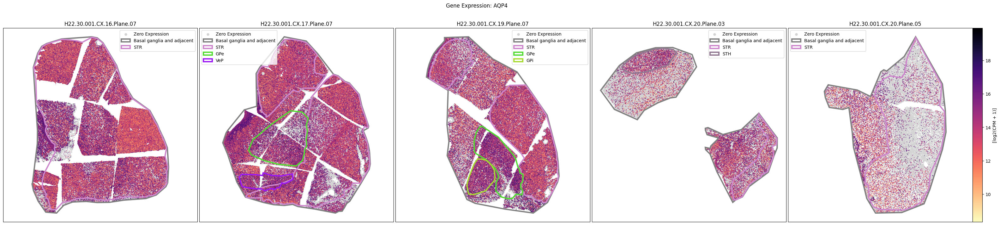

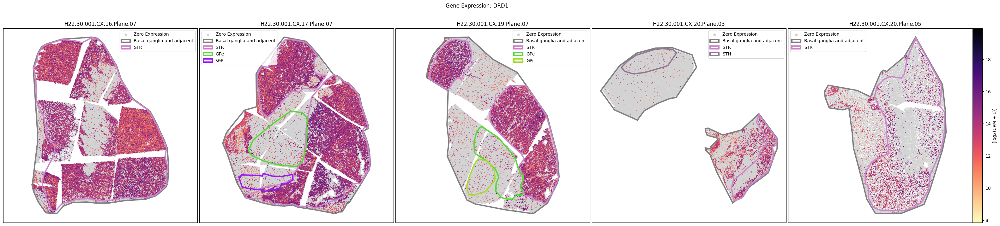

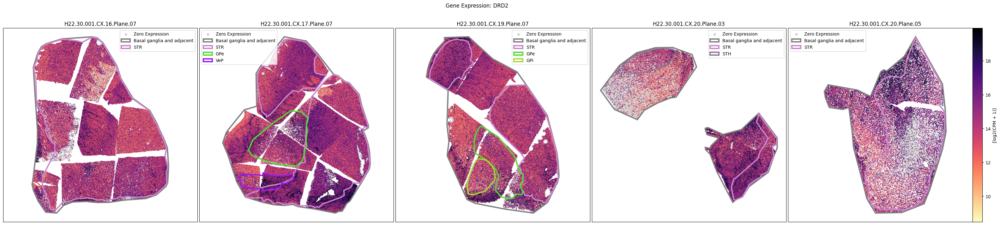

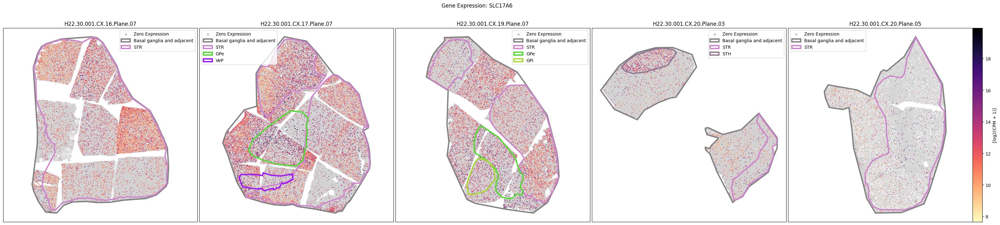

In [18]:
human_gene_names = human_cell_metadata_with_genes.columns[
    human_cell_metadata_with_genes.columns.isin(gene_names)
].to_numpy()
human_slab_list = [
    'H22.30.001.CX.16.Plane.07', 'H22.30.001.CX.17.Plane.07',
    'H22.30.001.CX.19.Plane.07', 'H22.30.001.CX.20.Plane.03', 'H22.30.001.CX.20.Plane.05'
]
for gene_symbol in human_gene_names:
    fig, ax = plot_slabs(
        human_cell_metadata_with_genes,
        gene_symbol,
        human_slab_list,
        species='human',
        cmap=plt.cm.magma_r,
        plot_polygons=True
    )
    fig.suptitle(f'Gene Expression: {gene_symbol}')
    plt.show()

QM23.50.001.CX.42.Plane.05.geojson: 100%|██████████| 1.61k/1.61k [00:00<00:00, 9.24kMB/s]


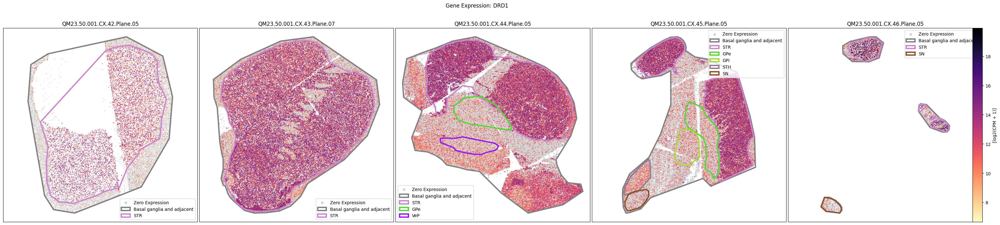

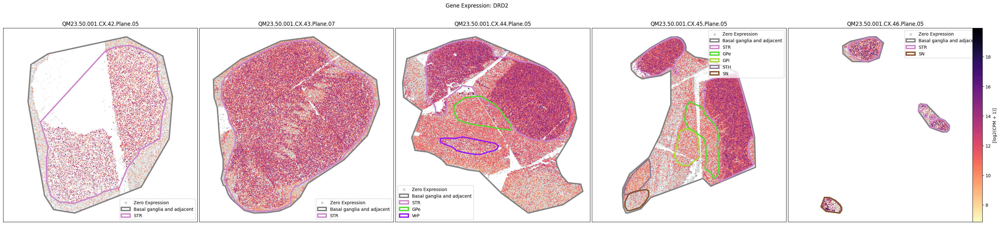

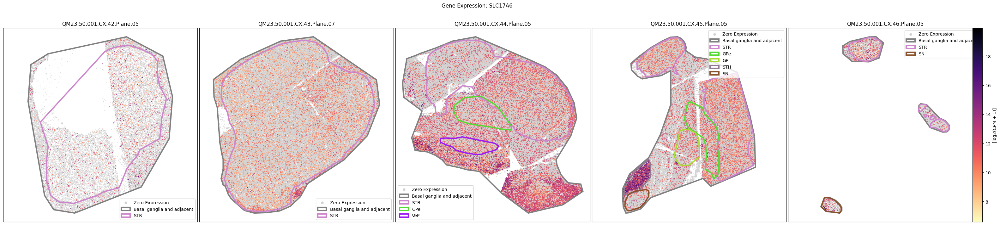

In [19]:
macaque_gene_names = macaque_cell_metadata_with_genes.columns[
    macaque_cell_metadata_with_genes.columns.isin(gene_names)
].to_numpy()
macaque_slab_list = [
    'QM23.50.001.CX.42.Plane.05', 'QM23.50.001.CX.43.Plane.07', 'QM23.50.001.CX.44.Plane.05',
    'QM23.50.001.CX.45.Plane.05', 'QM23.50.001.CX.46.Plane.05'
]
for gene_symbol in macaque_gene_names:
    fig, ax = plot_slabs(
        macaque_cell_metadata_with_genes,
        gene_symbol,
        macaque_slab_list,
        species='macaque',
        cmap=plt.cm.magma_r,
        plot_polygons=True
    )
    fig.suptitle(f'Gene Expression: {gene_symbol}')
    plt.show()

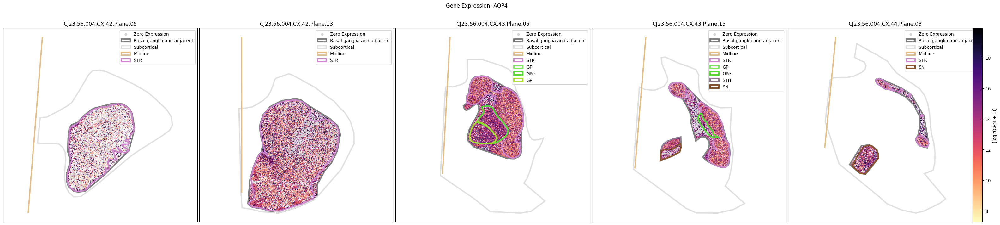

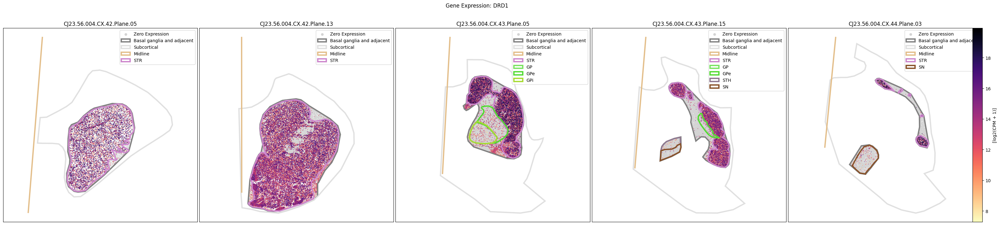

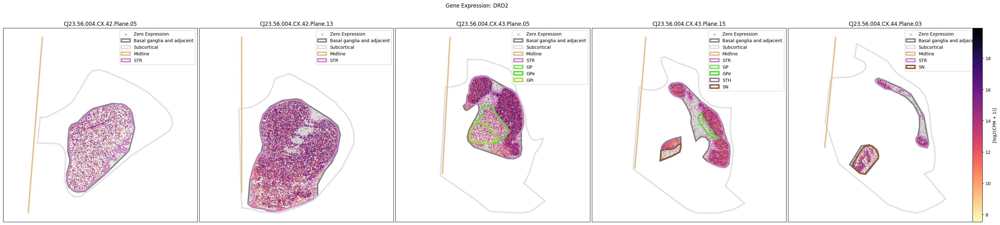

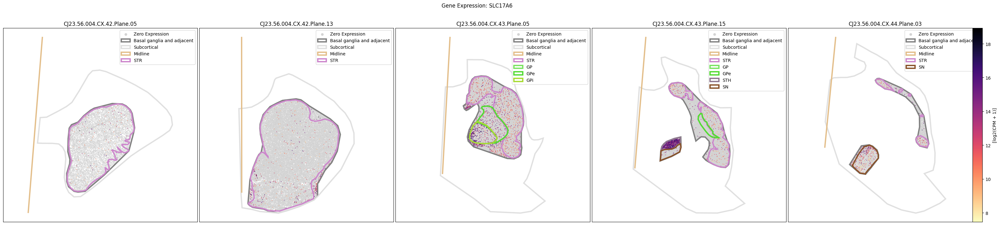

In [20]:
marmoset_gene_names = marmoset_cell_metadata_with_genes.columns[
    marmoset_cell_metadata_with_genes.columns.isin(gene_names)
].to_numpy()
marmoset_slab_list = [
    'CJ23.56.004.CX.42.Plane.05', 'CJ23.56.004.CX.42.Plane.13', 'CJ23.56.004.CX.43.Plane.05',
    'CJ23.56.004.CX.43.Plane.15', 'CJ23.56.004.CX.44.Plane.03'
]
for gene_symbol in marmoset_gene_names:
    fig, ax = plot_slabs(
        marmoset_cell_metadata_with_genes,
        gene_symbol,
        marmoset_slab_list,
        species='marmoset',
        cmap=plt.cm.magma_r,
        plot_polygons=True
    )
    fig.suptitle(f'Gene Expression: {gene_symbol}')
    plt.show()

## Manual anatomical annotations

We load tables that allow us to assign cells to the manual annotations plotted using the geojsons. These tables contain boolean assignments to a given manual annotation and column specifying a single unique assignment. 

In [21]:
human_cell_anatomical_annotations = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-H22.30.001-BG',
    file_name='cell_anatomical_annotations'
).set_index('cell_label')

macaque_cell_anatomical_annotations = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-QM23.50.001-BG',
    file_name='cell_anatomical_annotations'
).set_index('cell_label')

marmoset_cell_anatomical_annotations = abc_cache.get_metadata_dataframe(
    directory='HMBA-Xenium-CJ23.56.004-BG',
    file_name='cell_anatomical_annotations'
).set_index('cell_label')

In [22]:
value_sets = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-H22.30.001-BG',
    file_name='value_sets',
)
pred = value_sets['field'] == 'parcellation_term_symbol'
parcellation_terms = value_sets[pred].copy()
parcellation_terms.set_index('label', inplace=True)
parcellation_terms

def extract_value_set(cell_metadata_df: pd.DataFrame, input_value_set: pd.DataFrame, input_value_set_label: str):
    """Add color and order columns to the cell metadata dataframe based on the input
    value set.

    Columns are added as {input_value_set_label}_color and {input_value_set_label}_order.

    Parameters
    ----------
    cell_metadata_df : pd.DataFrame
        DataFrame containing cell metadata.
    input_value_set : pd.DataFrame
        DataFrame containing the value set information.
    input_value_set_label : str
        The the column name to extract color and order information for. will be added to the cell metadata.
    """
    cell_metadata_df[f'{input_value_set_label}_color'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[input_value_set_label]]['color_hex_triplet'].values
    cell_metadata_df[f'{input_value_set_label}_order'] = input_value_set[
        input_value_set['field'] == input_value_set_label
    ].loc[cell_metadata_df[input_value_set_label]]['order'].values

In [23]:
human_cell_metadata_with_genes = human_cell_metadata_with_genes.join(
    human_cell_anatomical_annotations[['parcellation_term_symbol']]
)
macaque_cell_metadata_with_genes = macaque_cell_metadata_with_genes.join(
    macaque_cell_anatomical_annotations[['parcellation_term_symbol']]
)
marmoset_cell_metadata_with_genes = marmoset_cell_metadata_with_genes.join(
    marmoset_cell_anatomical_annotations[['parcellation_term_symbol']]
)
extract_value_set(human_cell_metadata_with_genes, parcellation_terms, 'parcellation_term_symbol')
extract_value_set(macaque_cell_metadata_with_genes, parcellation_terms, 'parcellation_term_symbol')
extract_value_set(marmoset_cell_metadata_with_genes, parcellation_terms, 'parcellation_term_symbol')

# clean up memory
del human_cell_anatomical_annotations
del macaque_cell_anatomical_annotations
del marmoset_cell_anatomical_annotations

### Plotting heatmap expression data.

We define a helper functions *aggregate_by_metadata* to compute the average expression for a given category. Note that this is a simple wrapper of the Pandas GroupBy functionality. Other summary statistics beyond just the `mean` are listed here: https://pandas.pydata.org/docs/reference/groupby.html#dataframegroupby-computations-descriptive-stats

We also define a function to plot the resultant averaged data in a heatmap.

In [24]:
def aggregate_by_metadata(df: pd.DataFrame, gnames: List[str], value: str, sort: bool = False) -> pd.DataFrame:
    """Aggregate gene expression data by metadata.

    Parameters
    ----------
    df: pandas.DataFrame
        DataFrame containing gene expression and metadata.
    gnames: List[str]
        List of gene names to aggregate.
    value: str
    sort: bool
        Metadata column to group by.
        If True, sort the output by the first gene in gnames.

    Returns
    -------
    pandas.DataFrame
        DataFrame with aggregated gene expression values.
    """
    grouped = df.groupby(value)[gnames].mean()
    if sort:
        grouped = grouped.sort_values(by=gnames[0], ascending=False)
    return grouped


def plot_heatmap(
        df: pd.DataFrame,
        fig_width: int = 8,
        fig_height: int = 4,
        cmap: mpl.colormaps = plt.cm.magma_r,
        vmax: Optional[float] = None
    ) -> Tuple[plt.Figure, plt.Axes]:
    """Plot a heatmap from a DataFrame.

    Parameters
    ----------
    df: pandas.DataFrame
        DataFrame to plot as a heatmap.
    fig_width: int
        Width of the figure.
    fig_height: int
        Height of the figure.
    cmap: matplotlib.colors.Colormap
        Colormap to use for the heatmap.

    Returns
    -------
    fig: matplotlib.pyplot.Figure
        Figure object containing the heatmap.
    ax: matplotlib.pyplot.Axes
        Axes object containing the heatmap.
    """

    arr = df.to_numpy().astype('float')

    vmin = arr.min()
    vmax = arr.max()
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    cmap = sm.get_cmap()

    fig, ax = plt.subplots()
    fig.set_size_inches(fig_width, fig_height)

    ax.imshow(arr, cmap=cmap, aspect='auto')
    xlabs = df.columns.values
    ylabs = df.index.values

    ax.set_xticks(range(len(xlabs)))
    ax.set_xticklabels(xlabs)

    ax.set_yticks(range(len(ylabs)))
    ax.set_yticklabels(ylabs)

    cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.1, pad=0.01)
    cbar.set_label('[log2(CPM + 1)]')

    return fig, ax

### Visualize gene expression for selected genes by manual annotation region.

Below we average the expression of our selected genes across the different manually annotated regions that each cell is uniquely assigned to. We compute these expressions for each species individually. For a side by side comparison of gene expression heatmaps for each species, see the [HMBA 10X gene expression tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/hmba_bg_10X_snRNASeq_tutorial.html).

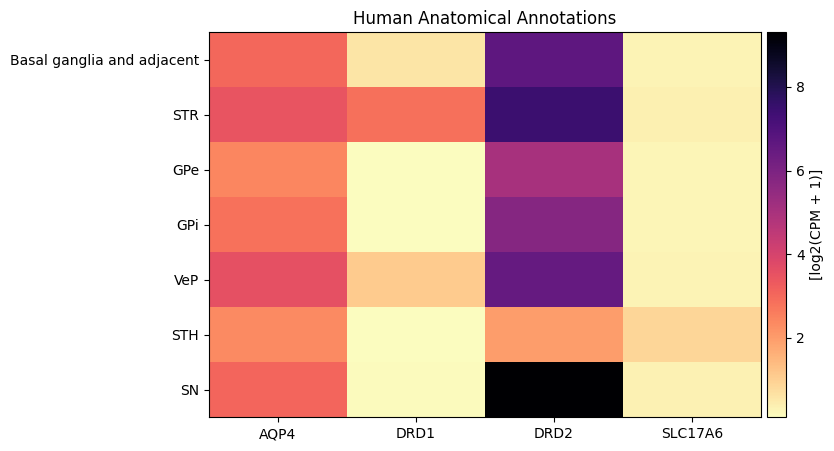

In [25]:
human_gene_names = human_cell_metadata_with_genes.columns[
    human_cell_metadata_with_genes.columns.isin(gene_names)
].to_numpy()
agg = aggregate_by_metadata(human_cell_metadata_with_genes, human_gene_names, 'parcellation_term_symbol', sort=True)
agg = agg.loc[parcellation_terms.index[parcellation_terms.index.isin(agg.index)]]
plot_heatmap(agg, 8, 5)
plt.title('Human Anatomical Annotations')
plt.show()

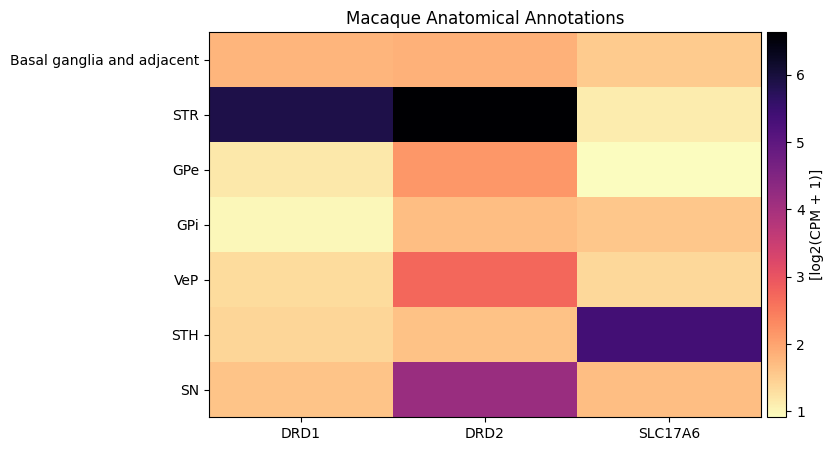

In [26]:
macaque_gene_names = macaque_cell_metadata_with_genes.columns[
    macaque_cell_metadata_with_genes.columns.isin(gene_names)
].to_numpy()
agg = aggregate_by_metadata(macaque_cell_metadata_with_genes, macaque_gene_names, 'parcellation_term_symbol', sort=True)
agg = agg.loc[parcellation_terms.index[parcellation_terms.index.isin(agg.index)]]
plot_heatmap(agg, 8, 5)
plt.title('Macaque Anatomical Annotations')
plt.show()

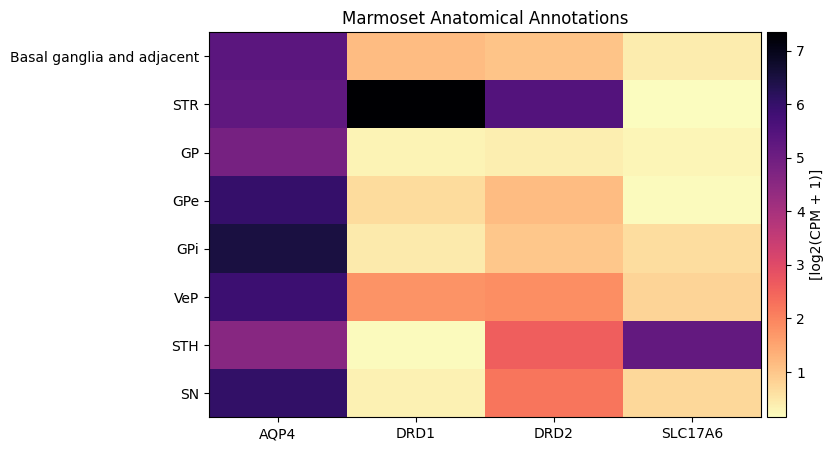

In [27]:
marmoset_gene_names = marmoset_cell_metadata_with_genes.columns[
    marmoset_cell_metadata_with_genes.columns.isin(gene_names)
].to_numpy()
agg = aggregate_by_metadata(marmoset_cell_metadata_with_genes, marmoset_gene_names, 'parcellation_term_symbol', sort=True)
agg = agg.loc[parcellation_terms.index[parcellation_terms.index.isin(agg.index)]]
plot_heatmap(agg, 8, 5)
plt.title('Marmoset Anatomical Annotations')
plt.show()

## Taxonomy mapping

Finally, let's load the taxonomy information so that we can plot gene expression versus various taxons in a heatmap for each species. Below, we load and merge all the information we need to plot cell colors and taxonomy as done in previous [HMBA tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/hmba_bg_clustering_analysis_and_annotation.html).

In [28]:
cluster = abc_cache.get_metadata_dataframe(
    directory='HMBA-BG-taxonomy-CCN20250428',
    file_name='cluster',
    dtype={'number_of_cells': 'Int64'}
).rename(columns={'label': 'cluster_annotation_term_label'}).set_index('cluster_annotation_term_label')
cluster_annotation_term_set = abc_cache.get_metadata_dataframe(
    directory='HMBA-BG-taxonomy-CCN20250428',
    file_name='cluster_annotation_term_set'
).rename(columns={'label': 'cluster_annotation_term_label'})

cluster_annotation_term = abc_cache.get_metadata_dataframe(
    directory='HMBA-BG-taxonomy-CCN20250428',
    file_name='cluster_annotation_term',
).rename(columns={'label': 'cluster_annotation_term_label'}).set_index('cluster_annotation_term_label')

cluster_to_cluster_annotation_membership = abc_cache.get_metadata_dataframe(
    directory='HMBA-BG-taxonomy-CCN20250428',
    file_name='cluster_to_cluster_annotation_membership',
).set_index('cluster_annotation_term_label')
membership_with_cluster_info = cluster_to_cluster_annotation_membership.join(
    cluster.reset_index().set_index('cluster_alias')[['number_of_cells']],
    on='cluster_alias'
)
membership_with_cluster_info = membership_with_cluster_info.join(cluster_annotation_term, rsuffix='_anno_term').reset_index()
membership_groupby = membership_with_cluster_info.groupby(
    ['cluster_alias', 'cluster_annotation_term_set_name']
)

cluster_annotation_term_set = abc_cache.get_metadata_dataframe(
    directory='HMBA-BG-taxonomy-CCN20250428',
    file_name='cluster_annotation_term_set'
).rename(columns={'label': 'cluster_annotation_term_label'})

# term_sets = abc_cache.get_metadata_dataframe(directory='WHB-taxonomy', file_name='cluster_annotation_term_set').set_index('label')
cluster_details = membership_groupby['cluster_annotation_term_name'].first().unstack()
cluster_order = membership_groupby['term_order'].first().unstack()
cluster_order.sort_values(['Neighborhood', 'Class', 'Subclass', 'Group', 'Cluster'], inplace=True)
cluster_order.rename(
    columns={'Neighborhood': 'Neighborhood_order',
             'Class': 'Class_order',
             'Subclass': 'Subclass_order',
             'Group': 'Group_order',
             'Cluster': 'Cluster_order'},
    inplace=True
)

cluster_colors = membership_groupby['color_hex_triplet'].first().unstack()
cluster_colors = cluster_colors[cluster_annotation_term_set['name']]
cluster_colors.sort_values(
    ['Neighborhood', 'Class', 'Subclass', 'Group', 'Cluster'],
    inplace=True
)

Each of the three species gene expression has been mapped to the HMBA 10X taxonomy using MapMyCells. Below we load the mapping of each cell to the cluster it was assigned data for each species in the HMBA-BG dataset.

In [29]:
human_cell_to_cluster = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-H22.30.001-BG',
    file_name='cell_to_cluster_membership_hmba-bg-20250428'
).set_index('cell_label')

macaque_cell_to_cluster = abc_cache.get_metadata_dataframe(
    directory='HMBA-MERSCOPE-QM23.50.001-BG',
    file_name='cell_to_cluster_membership_hmba-bg-20250428',
).set_index('cell_label')

marmoset_cell_to_cluster = abc_cache.get_metadata_dataframe(
    directory='HMBA-Xenium-CJ23.56.004-BG',
    file_name='cell_to_cluster_membership_hmba-bg-20250428',
).set_index('cell_label')

As in the [previous spatial tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/hmba_bg_spatial_slabs_and_taxonomy.html), the spatial data of the 3 HMBA-BG species in this release are registered to a extended version of the the taxonomy that contains clusters that are considered Adjacent to the Basal Ganglia. These are cell types that are present in the data but are not considered part of the basal ganglia. These clusters are mapped into a Group, Subclass, Class, and Neighborhood in a single path of the taxonomy called Adjacent. The release consensus taxonomy does not explicitly contain this taxon. We thus add them below, assigning any cell that was not mapped into to a group in the taxonomy an Adjacent cell type at all levels with a grey color. We give these Adjacent taxons a odering at the very end of the set of taxons at each level.

In [30]:
def fill_adjacent_data(input_df):
    output_df = input_df.fillna(
        {'cluster_alias': 'Adjacent',
         'cluster_label': 'Adjacent',
         'Class': 'Adjacent',
         'Cluster': 'Adjacent',
         'Group': 'Adjacent',
         'Neighborhood': 'Adjacent',
         'Subclass': 'Adjacent',
         'Neighborhood_color': '#808080',
         'Class_color': '#808080',
         'Subclass_color': '#808080',
         'Group_color': '#808080',
         'Cluster_color': '#808080',
         'Neighborhood_order': cluster_order.max()['Neighborhood_order'] + 1,
         'Class_order': cluster_order.max()['Class_order'] + 1,
         'Subclass_order': cluster_order.max()['Subclass_order'] + 1,
         'Group_order': cluster_order.max()['Group_order'] + 1,
         'Cluster_order': cluster_order.max()['Cluster_order'] + 1,
        }
    )
    return output_df.astype(
        {
            'Neighborhood_order': 'int',
            'Class_order': 'int',
            'Subclass_order': 'int',
            'Group_order': 'int',
            'Cluster_order': 'int',
        }
    )

In [31]:
human_cell_metadata_with_genes = human_cell_metadata_with_genes.join(human_cell_to_cluster)
human_cell_metadata_with_genes = human_cell_metadata_with_genes.join(cluster_details, on='cluster_alias')
human_cell_metadata_with_genes = human_cell_metadata_with_genes.join(cluster_colors, on='cluster_alias', rsuffix='_color')
human_cell_metadata_with_genes = human_cell_metadata_with_genes.join(cluster_order, on='cluster_alias')
human_cell_metadata_with_genes = fill_adjacent_data(human_cell_metadata_with_genes)

del human_cell_to_cluster

human_cell_metadata_with_genes.head()

,brain_section_label,brain_section_barcode,segmentation_job_id,x_experiment,y_experiment,qc_pass,dataset_label,feature_matrix_label,abc_sample_id,brain_section_barcode_specimen,...,Neighborhood_color,Class_color,Subclass_color,Group_color,Cluster_color,Class_order,Cluster_order,Group_order,Neighborhood_order,Subclass_order
cell_label,,,,,,,,,,,,,,,,,,,,,
1321115602_1-20250227,H22.30.001.CX.16.05.05.03,1321115602,sis_cellpose_v1,3285.3843,336.96967,False,HMBA-MERSCOPE-H22.30.001-BG,MERSCOPE-H22.30.001-BG,NaN,1321115602,...,#a8afa5,#594a26,#CCA43D,#CCA43D,#547f0c,3,220,13,1,9
1321115602_2-20250227,H22.30.001.CX.16.05.05.03,1321115602,sis_cellpose_v1,4730.3096,354.69010,False,HMBA-MERSCOPE-H22.30.001-BG,MERSCOPE-H22.30.001-BG,NaN,1321115602,...,#19613b,#d0b83c,#253c8c,#5713c3,#84c5ec,10,1294,56,3,32
1321115602_3-20250227,H22.30.001.CX.16.05.05.03,1321115602,sis_cellpose_v1,2966.4824,804.66986,False,HMBA-MERSCOPE-H22.30.001-BG,MERSCOPE-H22.30.001-BG,NaN,1321115602,...,#91f4bb,#0433b4,#77f0ca,#3EC918,#21a97d,6,456,24,2,16
1321115602_4-20250227,H22.30.001.CX.16.05.05.03,1321115602,sis_cellpose_v1,3765.8542,704.11170,True,HMBA-MERSCOPE-H22.30.001-BG,MERSCOPE-H22.30.001-BG,90bffbc4-c7d1-44bd-9a04-3780f81777c8,1321115602,...,#a8afa5,#a8afa5,#66493D,#66493D,#6e0e16,4,238,14,1,10
1321115602_5-20250227,H22.30.001.CX.16.05.05.03,1321115602,sis_cellpose_v1,3763.5205,716.22940,True,HMBA-MERSCOPE-H22.30.001-BG,MERSCOPE-H22.30.001-BG,182304c2-65e2-413e-9878-2de05bf4ff2f,1321115602,...,#a8afa5,#a8afa5,#B97300,#B97300,#1665ee,4,262,15,1,11


Load the Macaque and Marmoset data in the same way.

In [32]:
macaque_cell_metadata_with_genes = macaque_cell_metadata_with_genes.join(macaque_cell_to_cluster)
macaque_cell_metadata_with_genes = macaque_cell_metadata_with_genes.join(cluster_details, on='cluster_alias')
macaque_cell_metadata_with_genes = macaque_cell_metadata_with_genes.join(cluster_colors, on='cluster_alias', rsuffix='_color')
macaque_cell_metadata_with_genes = macaque_cell_metadata_with_genes.join(cluster_order, on='cluster_alias')
macaque_cell_metadata_with_genes = fill_adjacent_data(macaque_cell_metadata_with_genes)

del macaque_cell_to_cluster

macaque_cell_metadata_with_genes.head()

,brain_section_label,brain_section_barcode,segmentation_job_id,x_experiment,y_experiment,qc_pass,dataset_label,feature_matrix_label,abc_sample_id,brain_section_barcode_specimen,...,Neighborhood_color,Class_color,Subclass_color,Group_color,Cluster_color,Class_order,Cluster_order,Group_order,Neighborhood_order,Subclass_order
cell_label,,,,,,,,,,,,,,,,,,,,,
1291813781_1-20250227,QM23.50.001.CX.44.03.07.02,1291813781,sis_cellpose_v1,6328.8564,271.71730,False,HMBA-MERSCOPE-QM23.50.001-BG,MERSCOPE-QM23.50.001-BG,NaN,1291813781,...,#19613b,#d0b83c,#253c8c,#ff9896,#681364,10,1289,55,3,32
1291813781_2-20250227,QM23.50.001.CX.44.03.07.02,1291813781,sis_cellpose_v1,6313.3560,297.27830,False,HMBA-MERSCOPE-QM23.50.001-BG,MERSCOPE-QM23.50.001-BG,NaN,1291813781,...,#a8afa5,#a8afa5,#66493D,#66493D,#e86aa0,4,246,14,1,10
1291813781_3-20250227,QM23.50.001.CX.44.03.07.02,1291813781,sis_cellpose_v1,6323.7240,297.38340,False,HMBA-MERSCOPE-QM23.50.001-BG,MERSCOPE-QM23.50.001-BG,NaN,1291813781,...,#a8afa5,#995C60,#CC887A,#CC887A,#c79107,2,126,5,1,4
1291813781_4-20250227,QM23.50.001.CX.44.03.07.02,1291813781,sis_cellpose_v1,6370.7470,377.92710,False,HMBA-MERSCOPE-QM23.50.001-BG,MERSCOPE-QM23.50.001-BG,NaN,1291813781,...,#a8afa5,#995C60,#5A662E,#5A662E,#eb2f3c,2,137,6,1,5
1291813781_5-20250227,QM23.50.001.CX.44.03.07.02,1291813781,sis_cellpose_v1,6375.0240,386.81006,False,HMBA-MERSCOPE-QM23.50.001-BG,MERSCOPE-QM23.50.001-BG,NaN,1291813781,...,#a8afa5,#a8afa5,#a8afa5,#a8afa5,#f16ebe,4,288,17,1,13


In [33]:
marmoset_cell_metadata_with_genes = marmoset_cell_metadata_with_genes.join(marmoset_cell_to_cluster)
marmoset_cell_metadata_with_genes = marmoset_cell_metadata_with_genes.join(cluster_details, on='cluster_alias')
marmoset_cell_metadata_with_genes = marmoset_cell_metadata_with_genes.join(cluster_colors, on='cluster_alias', rsuffix='_color')
marmoset_cell_metadata_with_genes = marmoset_cell_metadata_with_genes.join(cluster_order, on='cluster_alias')
marmoset_cell_metadata_with_genes = fill_adjacent_data(marmoset_cell_metadata_with_genes)

del marmoset_cell_to_cluster

marmoset_cell_metadata_with_genes.head()

,brain_section_label,brain_section_barcode,segmentation_job_id,x_experiment,y_experiment,qc_pass,dataset_label,feature_matrix_label,abc_sample_id,brain_section_barcode_specimen,...,Neighborhood_color,Class_color,Subclass_color,Group_color,Cluster_color,Class_order,Cluster_order,Group_order,Neighborhood_order,Subclass_order
cell_label,,,,,,,,,,,,,,,,,,,,,
1382042951_abmkfncc-1-20250227,CJ23.56.004.CX.42.01.06,1382042951,xenium_cell_segmentation_kit_v1,5923.492676,6160.654297,True,HMBA-Xenium-CJ23.56.004-BG,Xenium-CJ23.56.004-BG,c8c08d8c-5147-4d03-b6f4-ca7bf4d0b8d1,1382042951,...,#a8afa5,#594a26,#594a26,#66391F,#5a9ad6,3,158,9,1,7
1382042951_abmmdgea-1-20250227,CJ23.56.004.CX.42.01.06,1382042951,xenium_cell_segmentation_kit_v1,6137.572266,6217.075684,True,HMBA-Xenium-CJ23.56.004-BG,Xenium-CJ23.56.004-BG,f10bad2c-9cc7-44bf-bd7e-4e61d28121bd,1382042951,...,#a8afa5,#401e66,#401e66,#195f8d,#9c3de0,1,36,1,1,1
1382042951_abmojfce-1-20250227,CJ23.56.004.CX.42.01.06,1382042951,xenium_cell_segmentation_kit_v1,5802.674805,5614.007812,True,HMBA-Xenium-CJ23.56.004-BG,Xenium-CJ23.56.004-BG,080466ff-3dea-44f1-b6e2-7892e8c12c95,1382042951,...,#a8afa5,#401e66,#564860,#564860,#f12367,1,81,3,1,2
1382042951_abmomnim-1-20250227,CJ23.56.004.CX.42.01.06,1382042951,xenium_cell_segmentation_kit_v1,5805.942383,5599.325684,True,HMBA-Xenium-CJ23.56.004-BG,Xenium-CJ23.56.004-BG,cee3bf8b-a159-42d1-983a-ac149b9edda9,1382042951,...,#a8afa5,#401e66,#564860,#564860,#82d054,1,84,3,1,2
1382042951_aeiamgga-1-20250227,CJ23.56.004.CX.42.01.06,1382042951,xenium_cell_segmentation_kit_v1,6291.268066,6068.720215,True,HMBA-Xenium-CJ23.56.004-BG,Xenium-CJ23.56.004-BG,3f24c46e-9ab1-4a54-a6fc-591f752edb48,1382042951,...,#a8afa5,#594a26,#594a26,#66391F,#5a9ad6,3,158,9,1,7


### Visualize gene expression for selected genes by the HMBA-BG taxonomy.

Below we average the expression of our selected genes across taxons from the HMBA-BG taxonomy. We show the expression for taxons at the class level for each species. For a side by side comparison of gene expression heatmaps for each species, see the [HMBA 10X gene expression tutorial](https://alleninstitute.github.io/abc_atlas_access/notebooks/hmba_bg_10X_snRNASeq_tutorial.html).

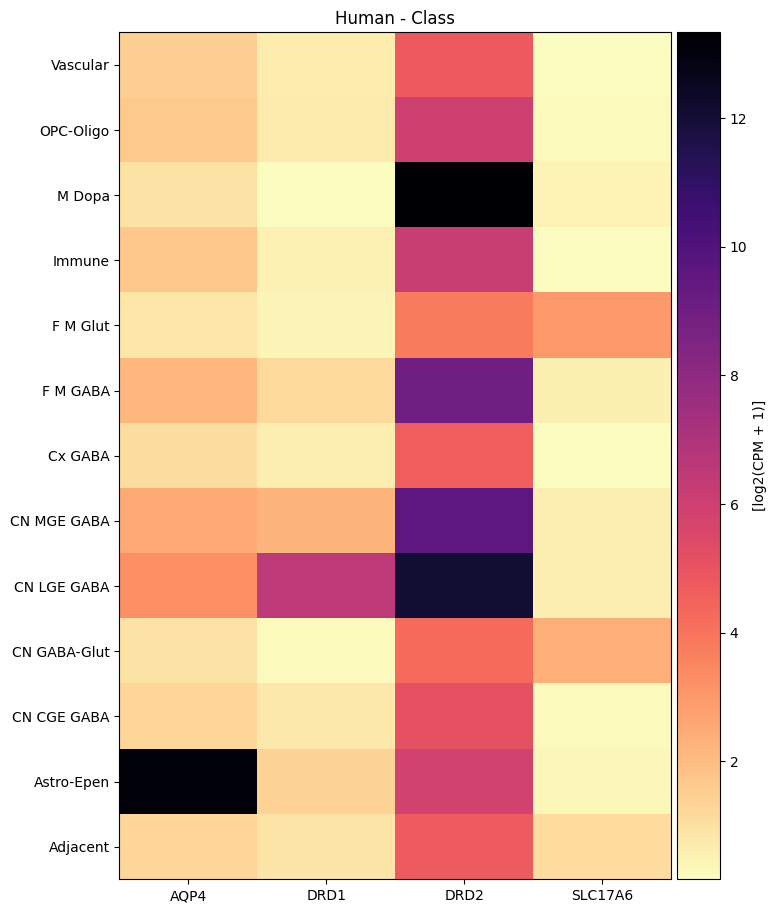

In [34]:
human_gene_names = human_cell_metadata_with_genes.columns[
    human_cell_metadata_with_genes.columns.isin(gene_names)
].to_numpy()
agg = aggregate_by_metadata(human_cell_metadata_with_genes, human_gene_names, 'Class')
agg = agg.loc[list(reversed(list(agg.index)))]
plot_heatmap(agg, 8, 11, vmax=15)
plt.title('Human - Class')
plt.show()

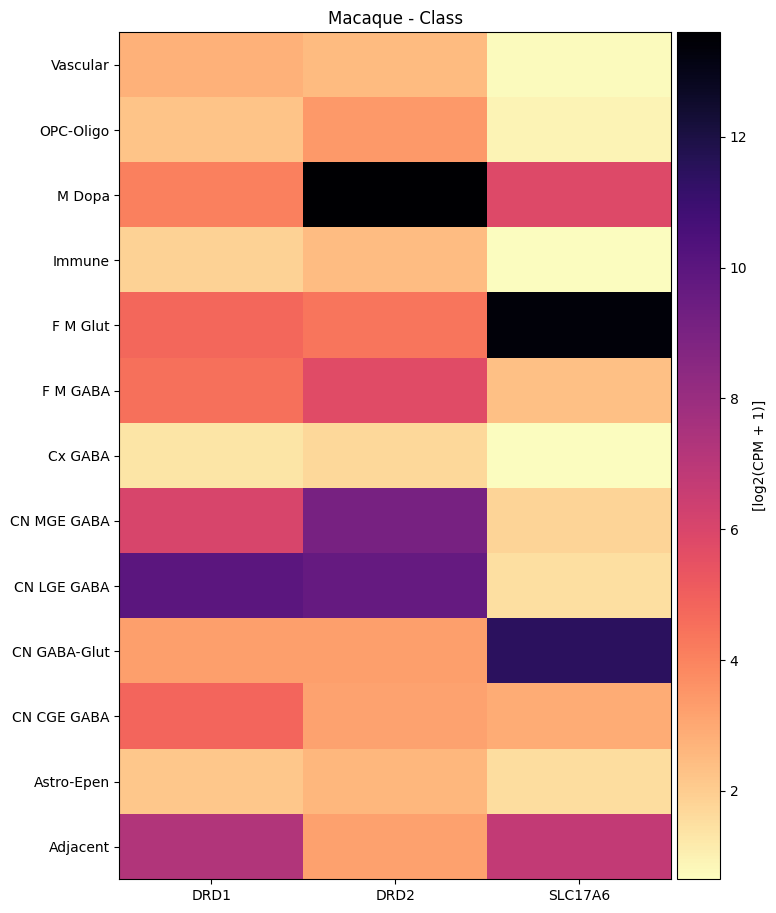

In [35]:
macaque_gene_names = macaque_cell_metadata_with_genes.columns[
    macaque_cell_metadata_with_genes.columns.isin(gene_names)
].to_numpy()
agg = aggregate_by_metadata(macaque_cell_metadata_with_genes, macaque_gene_names, 'Class')
agg = agg.loc[list(reversed(list(agg.index)))]
plot_heatmap(agg, 8, 11, vmax=15)
plt.title('Macaque - Class')
plt.show()

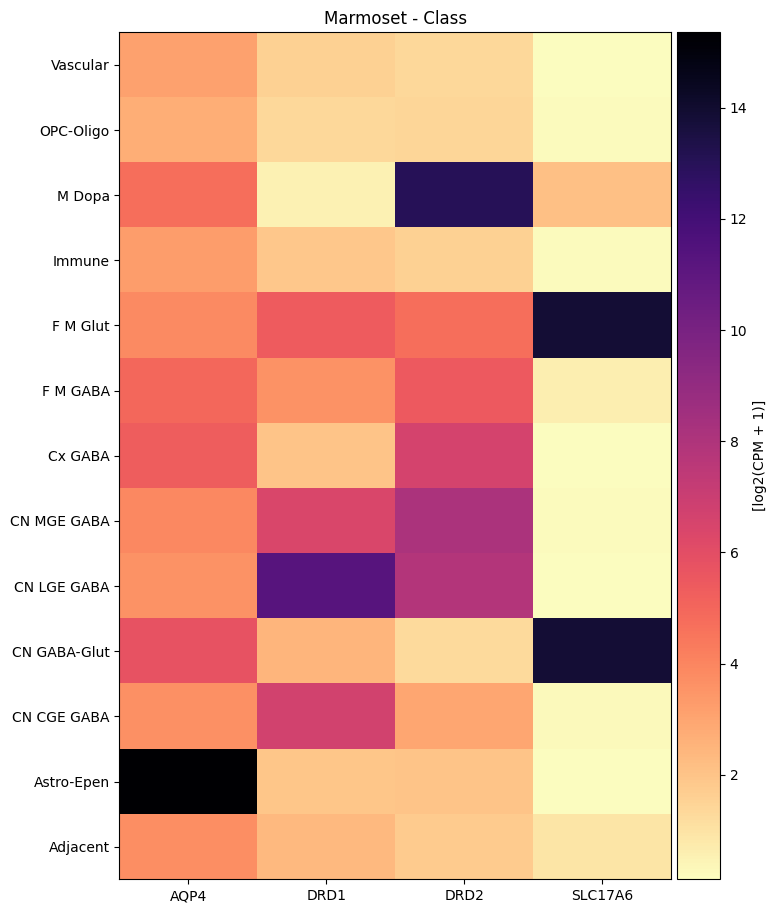

In [36]:
marmoset_gene_names = marmoset_cell_metadata_with_genes.columns[
    marmoset_cell_metadata_with_genes.columns.isin(gene_names)
].to_numpy()
agg = aggregate_by_metadata(marmoset_cell_metadata_with_genes, marmoset_gene_names, 'Class')
agg = agg.loc[list(reversed(list(agg.index)))]
plot_heatmap(agg, 8, 11, vmax=15)
plt.title('Marmoset - Class')
plt.show()

To learn more about the spatial data see the [HBMA-BG Spatial Slabs and Taxonomy notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/hmba_bg_spatial_slabs_and_taxonomy.html).

To learn more about the taxonomy used in this notebook and the data it is derived from, see the [HMBA-BG Clustering Analysis and Taxonomy notebook](https://alleninstitute.github.io/abc_atlas_access/notebooks/hmba_bg_clustering_analysis_and_annotation.html).